# Initialization

## Import

In [1]:
import matplotlib.pyplot as plt
from sklearn import metrics
import math
import ml_models_search.params_searchers.feature_importance_extractor as feat_imp_ext
import aqi_calculations.aqi_calculator as aqc
import lgbm_optuna_column_filter as lgbm_fl
import pandas as pd
from sklearn.model_selection import TimeSeriesSplit
import ml_models_search.ts_splitter as ts_splitter
import warnings
warnings.filterwarnings('ignore')

## Constants

In [2]:
METRIC = 'rmse'
OBJECTIVE = 'regression'
OPTIMIZATION_DIRECTION = 'minimize'
CATEGORIES = [[], ['season'], ['month'], ['year'], ['season', 'month'], ['season', 'month', 'year'], ['season', 'month', 'weekday']]

TRAIN_DATE_FROM = '2015-01-08'
TRAIN_DATE_TO = '2023-02-05'
VAL_DATE_FROM = '2023-02-06'
VAL_DATE_TO = '2023-02-12'

CSV_JOINT_FILE = '../../datasources/ds_joint/ds.csv'
CSV_SCORE_FILE = 'score.csv'

DATE_USE_COLUMNS = ['weekday', 'day', 'month', 'year', 'season', 'is_weekend', 'is_new_year']
WEATHER_USE_COLUMNS = ['tavg', 'tmin', 'tmax', 'prcp', 'wdir', 'wspd', 'wpgt', 'pres']
AQI_USE_COLUMNS = ['AQI_O3', 'AQI_PM25', 'AQI_PM10', 'AQI_NO2', 'AQI']
CONC_MEAN_USE_COLUMNS = ['C_mean_O3', 'C_mean_PM25', 'C_mean_PM10', 'C_mean_NO2']
CONC_MAX_USE_COLUMNS = ['C_max_O3', 'C_max_PM25', 'C_max_PM10',  'C_max_NO2']

POL_CODES = [7, 6001, 5, 8]
POL_NAMES = {7: "O3", 6001: "PM25", 5: "PM10", 8: "NO2"}
POL_MEASURES = {7: "µg/m3", 6001: "µg/m3", 5: "µg/m3", 10: "mg/m3", 1: "µg/m3", 8: "µg/m3"}

## Source data load

In [3]:
df_joint = pd.read_csv(CSV_JOINT_FILE, parse_dates=True, index_col='DatetimeEnd')

In [4]:
df_score = pd.DataFrame(columns=['train_score', 'val_score', 'target', 'pol_id', 'weather_YN', 'AQI_lags_YN', 'C_lags_YN', 'simple_lags_YN', 'gen_lags_YN', 'params', 'categories', 'top_feat_count'])

## Functions

In [5]:
def score_by_feature_count(o_helper, len_features, best_params, categories):
    tr_by_cat = []
    vl_by_cat = []
    o_helper.study_best_params = best_params
    for ctg in categories:
        train_scs = []
        val_scs = []
        for feat_ind in range(1, len_features):
            o_helper.cut_best_features(feat_ind)
            score_tr, score_vl, mdl = o_helper.run_model_and_eval(params=best_params,  categorical_features=ctg, best_features_only=True, set_as_best_model=False)
            train_scs.append(score_tr)
            val_scs.append(score_vl)
        tr_by_cat.append(train_scs)
        vl_by_cat.append(val_scs)
    return tr_by_cat, vl_by_cat

In [6]:
def plot_score_grouped_by_categories_by_feature_count(len_features, score_by_cat, sub_title=""):
    plt.figure(figsize=(21, 7))
    for cat_ind in range(0, len(categories_test)):
        plt.plot(range(1, len_features),score_by_cat[cat_ind], label=("_".join(categories_test[cat_ind]) if len(categories_test[cat_ind]) > 0 else "no_cat"))
    plt.title(f'Score by features count. {sub_title}')
    plt.legend()
    plt.show()

In [7]:
def plot_train_val_score_by_feature_count(len_features, train_scs, val_scs, sub_title=""):
    plt.figure(figsize=(21, 7))
    plt.plot(range(1, len_features),train_scs, label="train_score")
    plt.plot(range(1, len_features),val_scs, label="val_score")
    plt.title(f'Train/Val score by features count. {sub_title}')
    plt.legend()
    plt.show()

In [8]:
def score_and_plot_by_feature_count(o_helper, len_features, best_params, categories):
    tr_by_cat, vl_by_cat = score_by_feature_count(o_helper, len_features, best_params, categories)
    plot_score_grouped_by_categories_by_feature_count(len_features, tr_by_cat, sub_title="Train scores")
    plot_score_grouped_by_categories_by_feature_count(len_features, vl_by_cat, sub_title="Val scores")
    for cat_ind in range(len(categories)):
        plot_train_val_score_by_feature_count(len_features, tr_by_cat[cat_ind], vl_by_cat[cat_ind],
                                              sub_title=f"First cats: {('_'.join(categories[cat_ind]) if len(categories[cat_ind]) > 0 else 'no_cat')}")

# Test models

## O3

### O3 AQI - weather, lags, gen lags

In [10]:
default_params_pol_o3 = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category_pol_o3 =['season', 'month']

default_features_count_pol_o3 = -1

optuna_helper_pol_o3, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=7, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params_pol_o3, default_category=default_category_pol_o3,                                   categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count_pol_o3)

In [22]:
optuna_helper_pol_o3.run_params_search(n_trials=2, n_jobs=12, study_name="o3", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(16), warm_params=None)

[I 2023-03-01 07:38:32,323] A new study created in memory with name: o3


run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 3 finished with best value: 34.189826389317076 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2200, 'num_leaves': 62, 'learning_rate': 0.08009707883592895, 'subsample': 0.14133204663696797, 'subsample_freq': 3, 'subsample_for_bin': 159396, 'min_child_samples': 399, 'reg_alpha': 0.8880220383094288, 'reg_lambda': 0.36386628173990654, 'max_depth': 7, 'max_bin': 60, 'categorical_features': []}. 
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 7 finished with best value: 34.18982638931707 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2400, 'n

10.272908151549409

In [11]:
best_o3_params = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2600, 'num_leaves': 29, 'learning_rate': 0.12226624793990773, 'subsample': 0.8259925800585568, 'subsample_freq': 6, 'subsample_for_bin': 311124, 'min_child_samples': 13, 'reg_alpha': 0.1877661803380422, 'reg_lambda': 0.12122085900675779, 'max_depth': 7, 'max_bin': 346}
best_o3_categories =  ['season', 'month', 'year']
best_o3_features_count = 22
#(3.542295951763197, 7.429274530771139)

# best_o3_params = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2100, 'num_leaves': 61, 'learning_rate': 0.151772418803207, 'subsample': 0.9378456272117659, 'subsample_freq': 0, 'subsample_for_bin': 128850, 'min_child_samples': 10, 'reg_alpha': 0.33551505176149066, 'reg_lambda': 0.5428469888399343, 'max_depth': 3, 'max_bin': 243}
# best_o3_categories =  ['season', 'month']
# best_o3_features_count = 120 # len(x_train.columns)

optuna_helper_pol_o3.cut_best_features(best_o3_features_count)
optuna_helper_pol_o3.study_best_params = best_o3_params
score_train_o3, score_val_o3, model_o3 = optuna_helper_pol_o3.run_model_and_eval(params=best_o3_params,  categorical_features=best_o3_categories, best_features_only=True, set_as_best_model=True)
score_train_o3, score_val_o3

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero


(4.335011918487668, 7.500788505391877)

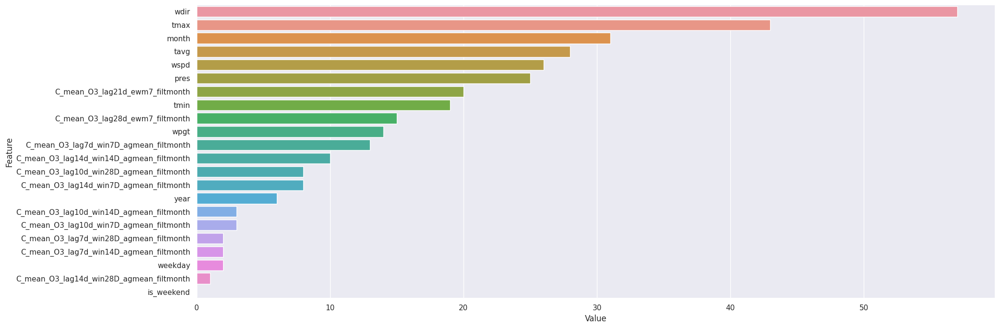

In [12]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper_pol_o3.best_model, optuna_helper_pol_o3.best_features_list, num=22, plot_bar=True)

In [ ]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 7, 'weather': True, 'sources': 'AQI, lag, gen_lag',  'train_score': score_train_o3, 'val_score': score_val_o3 }
df_score

In [57]:
categories_test = [[], ['season'], ['month'], ['year'], ['is_weekend'], ['day'], ['weekday']]
    #, ['season', 'month'], ['season', 'month', 'year'], ['season', 'month', 'is_weekend']]

#categories_test = [['season']]

train_scores = []
val_scores = []

train_by_cat = []
train_by_val = []

optuna_helper_pol_o3.study_best_params = best_o3_params
for cat in categories_test:
    train_scores = []
    val_scores = []
    for i in range(1, 151):
        optuna_helper_pol_o3.cut_best_features(i)
        score_train_o3, score_val_o3, model_o3 = optuna_helper_pol_o3.run_model_and_eval(params=best_o3_params,  categorical_features=cat, best_features_only=True, set_as_best_model=False)
        train_scores.append(score_train_o3)
        val_scores.append(score_val_o3)
    train_by_cat.append(train_scores)
    train_by_val.append(val_scores)

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categoric

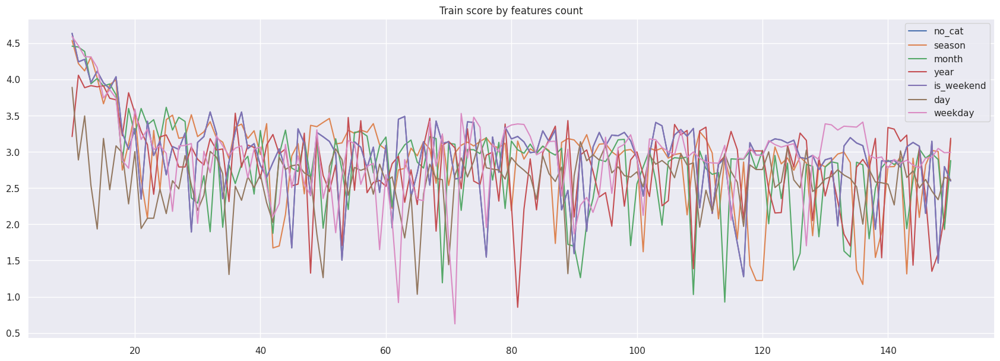

In [67]:
# import matplotlib.pyplot as plt
# from importlib import reload
# plt=reload(plt)

plt.figure(figsize=(21, 7))
for i in range(0, len(categories_test)):
    plt.plot(range(10, 151),train_by_cat[i][9:], label=("_".join(categories_test[i]) if len(categories_test[i]) > 0 else "no_cat"))

plt.title('Train score by features count')
plt.legend()
plt.show()

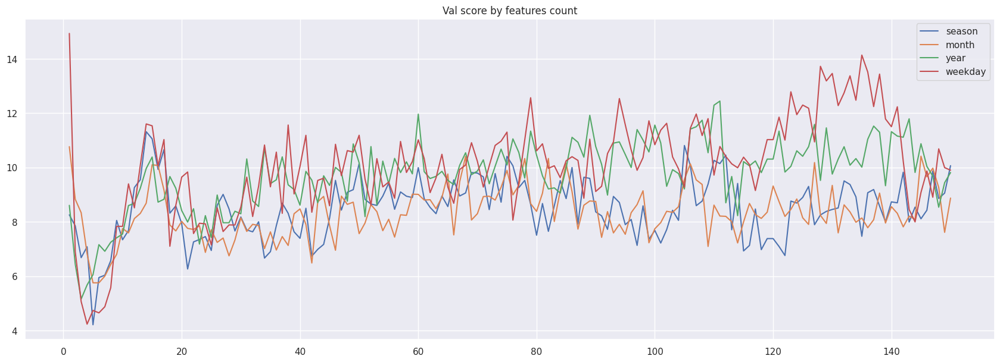

In [68]:
plt.figure(figsize=(21, 7))
for i in range(0, len(categories_test)):
    if categories_test[i] in [[], ['day'], ['is_weekend']]:
        continue
    plt.plot(range(1, 151),train_by_val[i], label=("_".join(categories_test[i]) if len(categories_test[i]) > 0 else "no_cat"))

plt.title('Val score by features count')
plt.legend()
plt.show()

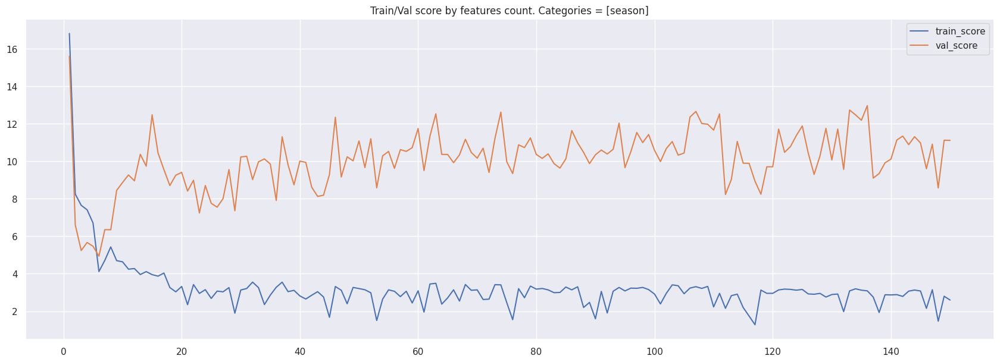

In [69]:
plt.figure(figsize=(21, 7))
plt.plot(range(1, 151),train_by_cat[0], label="train_score")
plt.plot(range(1, 151),train_by_val[0], label="val_score")
plt.title('Train/Val score by features count. Categories = [season]')
plt.legend()
plt.show()

In [23]:
y_val_pred = optuna_helper_pol_o3.predict_by_best_model(x_val)
display(y_val_pred)

array([19.90428337, 17.02065523, 18.45823955, 18.95620203, 20.01406574,
       23.64414566, 17.68618588])

In [24]:
math.sqrt(metrics.mean_squared_error(y_val.values, y_val_pred))

7.1382932381908955

### O3 AQI - no weather, by AQIs, no simple lags

In [13]:
default_params_pol_o3 = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category_pol_o3 =['season', 'month']

default_features_count_pol_o3 = -1

optuna_helper_pol_o3, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=7, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=True, use_c_mean_cols=False, use_lag_cols=False, use_gen_lags_cols=True, use_weather_cols=False,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params_pol_o3, default_category=default_category_pol_o3,                                   categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count_pol_o3)

In [78]:
optuna_helper_pol_o3.run_params_search(n_trials=100, n_jobs=12, study_name="o3", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 1 finished with best value: 34.53825968031879 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1300, 'num_leaves': 57, 'learning_rate': 0.09468477476665346, 'subsample': 0.20634898587909078, 'subsample_freq': 2, 'subsample_for_bin': 61832, 'min_child_samples': 354, 'reg_alpha': 0.29749582435231003, 'reg_lambda': 0.44404642255582605, 'max_depth': 4, 'max_bin': 70, 'categorical_features': ['season', 'month']}. 
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 2 finished with best value: 25.884813202336147 and par

15.40145352589795

In [14]:
best_o3_params = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1100, 'num_leaves': 80, 'learning_rate': 0.05573303532647756, 'subsample': 0.9955209860526888, 'subsample_freq': 9, 'subsample_for_bin': 263851, 'min_child_samples': 147, 'reg_alpha': 0.30828095570825953, 'reg_lambda': 0.4172971754317271, 'max_depth': 3, 'max_bin': 393, 'categorical_features': ['season', 'month', 'year']}

best_o3_categories =  ['season', 'month', 'year']
best_o3_features_count =37 #len(x_train.columns)
optuna_helper_pol_o3.study_best_params = best_o3_params
optuna_helper_pol_o3.cut_best_features(best_o3_features_count)
score_train_o3, score_val_o3, model_o3 = optuna_helper_pol_o3.run_model_and_eval(params=best_o3_params,  categorical_features=best_o3_categories, best_features_only=True, set_as_best_model=True)
score_train_o3, score_val_o3

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero


(13.617533130751092, 10.619566120910243)

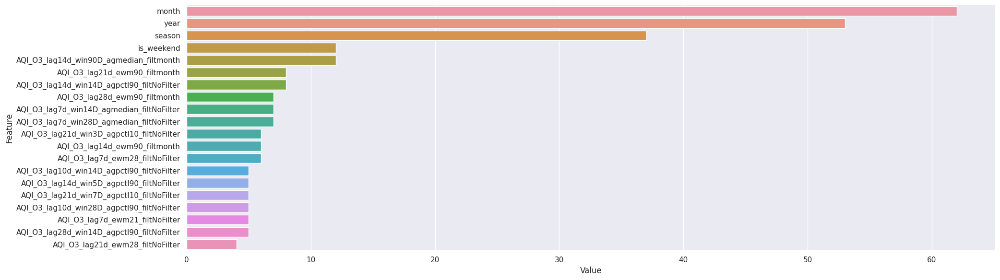

In [15]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper_pol_o3.best_model, optuna_helper_pol_o3.best_features_list, num=20, plot_bar=True)

In [36]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 7, 'weather': False, 'sources': 'AQI, gen_lag',  'train_score': score_train_o3, 'val_score': score_val_o3 }
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566


### O3 AQI - no weather, by AQIs, simple lags, generated lags

In [16]:
default_params_pol_o3 = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category_pol_o3 =['season', 'month']

default_features_count_pol_o3 = -1

optuna_helper_pol_o3, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=7, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=True, use_c_mean_cols=False, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=False,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params_pol_o3, default_category=default_category_pol_o3,                                   categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count_pol_o3)

In [53]:
optuna_helper_pol_o3.run_params_search(n_trials=100, n_jobs=12, study_name="o3", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 5 finished with best value: 34.53825968031879 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2800, 'num_leaves': 60, 'learning_rate': 0.11605943726774276, 'subsample': 0.41338524785348396, 'subsam

15.49838956562419

In [18]:
best_o3_params = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1800, 'num_leaves': 33, 'learning_rate': 0.08579693983921975, 'subsample': 0.6572540674128093, 'subsample_freq': 7, 'subsample_for_bin': 147495, 'min_child_samples': 83, 'reg_alpha': 0.13178302447317589, 'reg_lambda': 0.18287010029672546, 'max_depth': 4, 'max_bin': 235, 'categorical_features': ['season', 'month', 'year']}

best_o3_categories =  ['season', 'month', 'year']
best_o3_features_count = 21# len(x_train.columns)
optuna_helper_pol_o3.study_best_params = best_o3_params
optuna_helper_pol_o3.cut_best_features(best_o3_features_count)
score_train_o3, score_val_o3, model_o3 = optuna_helper_pol_o3.run_model_and_eval(params=best_o3_params,  categorical_features=best_o3_categories, best_features_only=True, set_as_best_model=True)
score_train_o3, score_val_o3

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero


(12.279893124829995, 12.105679637383169)

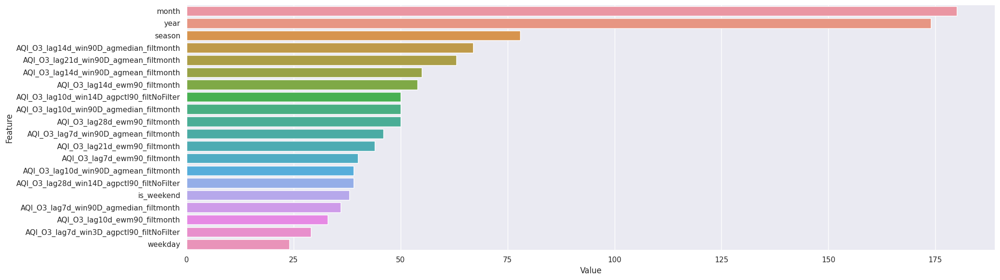

In [19]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper_pol_o3.best_model, optuna_helper_pol_o3.best_features_list, num=20, plot_bar=True)

In [ ]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 7, 'weather': False, 'sources': 'AQI, lag, gen_lag',  'train_score': score_train_o3, 'val_score': score_val_o3 }
df_score

### O3 Concentration - weather, generated lags

In [108]:
default_params_pol_o3 = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category_pol_o3 =['season', 'month']

default_features_count_pol_o3 = -1

optuna_helper_pol_o3, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=7, prediction_value_type=lgbm_fl.PredictionValueType.C_MEAN,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=False, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params_pol_o3, default_category=default_category_pol_o3,                                   categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count_pol_o3)

In [230]:
optuna_helper_pol_o3.run_params_search(n_trials=100, n_jobs=12, study_name="o3", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 3 finished with best value: 46.45484911281591 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1600, 'num_leaves': 110, 'learning_rate': 0.12032440570017887, 'subsample': 0.2738790953911412, 'subsample_freq': 7, 'subsample_for_bin': 446339, 'min_child_samples': 562, 'reg_alpha': 0.86754830002646, 'reg_lambda': 0.5290945380670815, 'ma

12.107842165458376

In [113]:
best_o3_params = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2000, 'num_leaves': 60, 'learning_rate': 0.06458913856273316, 'subsample': 0.6904176616812875, 'subsample_freq': 0, 'subsample_for_bin': 290442, 'min_child_samples': 10, 'reg_alpha': 0.6859532019580687, 'reg_lambda': 0.23803297313996905, 'max_depth': 4, 'max_bin': 378}

best_o3_categories =  ['season']
best_o3_features_count = 11 #len(x_train.columns) #11
optuna_helper_pol_o3.study_best_params = best_o3_params
optuna_helper_pol_o3.cut_best_features(best_o3_features_count)
score_train_o3, score_val_o3, model_o3 = optuna_helper_pol_o3.run_model_and_eval(params=best_o3_params,  categorical_features=best_o3_categories, best_features_only=True, set_as_best_model=True)
score_train_o3, score_val_o3

(8.139091631156132, 8.057300461063658)

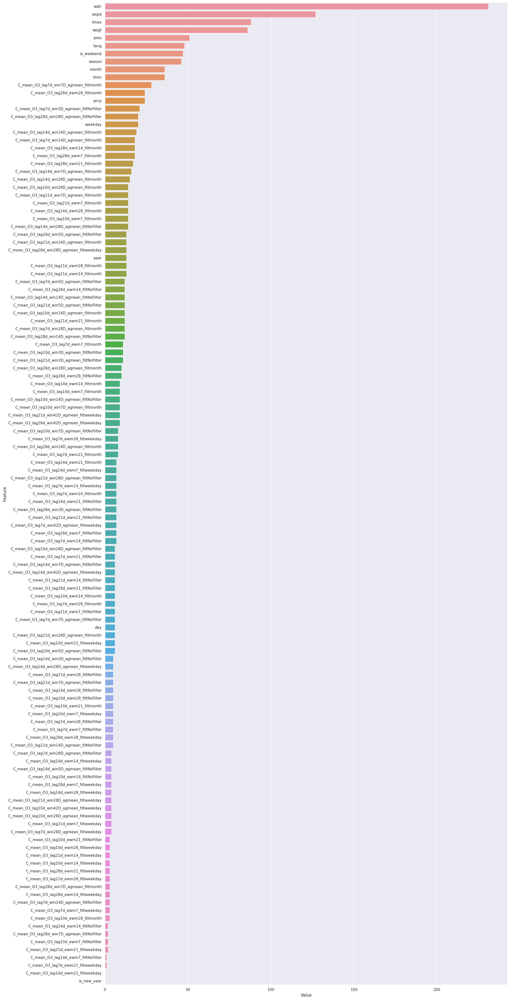

In [110]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper_pol_o3.best_model, optuna_helper_pol_o3.best_features_list, num=best_o3_features_count, plot_bar=True)

In [111]:
feat_imp_df[feat_imp_df['Value'] > 0].shape[0]

123

In [ ]:
df_score.loc[df_score.shape[0]] = {'target': 'C_mean', 'pol_id' : 7, 'weather': True, 'sources': 'C_mean, gen_lag',  'train_score': score_train_o3, 'val_score': score_val_o3 }
df_score

In [213]:
df_score.to_csv("score.csv")

## PM 2.5

AQI research by different columns set was extracted to another notebook

### PM2.5 Concentration - weather

In [26]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['month', 'weekday']
cats = [['season', 'month', 'weekday'], ['month', 'weekday']]

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=6001, prediction_value_type=lgbm_fl.PredictionValueType.C_MEAN,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=cats, default_top_features_count=default_features_count)

In [27]:
optuna_helper.run_params_search(n_trials=100, n_jobs=4, study_name="pm25", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(16), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

Trial 0 finished with best value: 10.863480496041745 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2800, 'num_leaves': 149, 'learning_rate': 0.13057304992550245, 'subsample': 0.5680602574156842, 'subsample_freq': 2, 'subsample_for_bin': 239527, 'min_child_samples': 503, 'reg_alpha': 0.9930148284356447, 'reg_lambda': 0.03600898379062112, 'max_depth': 5, 'max_bin': 194, 'categorical_features': ['season', 'month', 'weekday']}. 
Trial 1 finished with best value: 9.914467966905182 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1200, 'num_leaves': 61, 'learning_rate': 0.06300750831719838, 'subsample': 0.5929883238082873, 'subsample_freq': 8, 'subsample_for_bin': 129186, 'min_child_samples': 436, 'reg_alpha': 0.8980924616833059, 'reg_lambda': 0.9423408065261272, 'max_depth': 9,

6.269386427093242

In [42]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2000, 'num_leaves': 44, 'learning_rate': 0.05146186321055205, 'subsample': 0.4828694228130162, 'subsample_freq': 1, 'subsample_for_bin': 367629, 'min_child_samples': 14, 'reg_alpha': 0.6023340406852244, 'reg_lambda': 0.6366257905041786, 'max_depth': 5, 'max_bin': 222}

best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1300, 'num_leaves': 74, 'learning_rate': 0.0941211203772379, 'subsample': 0.7622679372871137, 'subsample_freq': 9, 'subsample_for_bin': 279278, 'min_child_samples': 65, 'reg_alpha': 0.4646982657450759, 'reg_lambda': 0.6884946543909979, 'max_depth': 6, 'max_bin': 357}

# best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2900, 'num_leaves': 34, 'learning_rate': 0.09380387191547097, 'subsample': 0.37028642695734926, 'subsample_freq': 0, 'subsample_for_bin': 309624, 'min_child_samples': 44, 'reg_alpha': 0.1303336140228358, 'reg_lambda': 0.47475500500854195, 'max_depth': 4, 'max_bin': 50}

best_categories =  ['season', 'month', 'weekday']
best_features_count = 39 # len(x_train.columns) #39 - 16.6
optuna_helper.study_best_params = best_params_res
optuna_helper.cut_best_features(best_features_count)
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(2.3156480288003998, 19.496469873011495)

In [29]:
feat_imp_df['Value'].median()

38.0

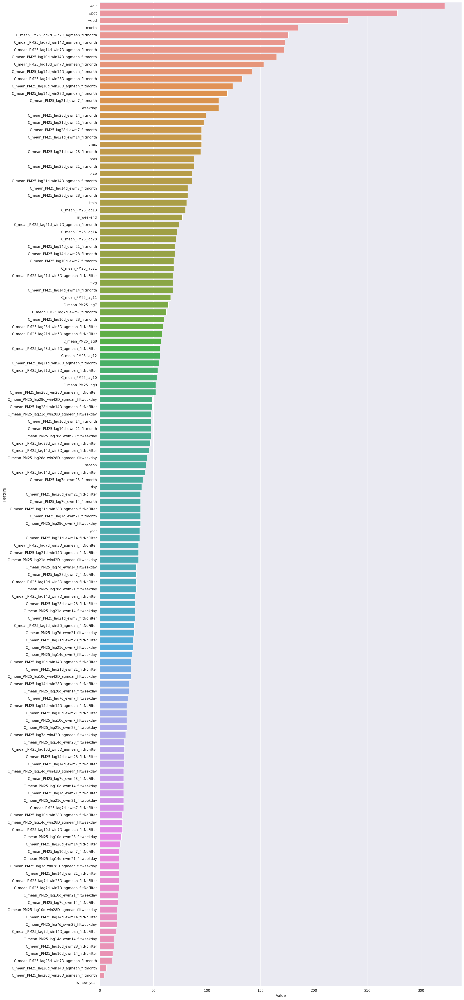

In [16]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [ ]:
df_score.loc[df_score.shape[0]] = {'target': 'C_mean', 'pol_id' : 6001, 'weather': True, 'sources': 'C_mean, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }

#### Convert prediction of concentration for PM2.5 to AQI and check score

In [43]:
y_val_pred = optuna_helper.predict_by_best_model(x_val)
display(y_val_pred)

array([21.47651747, 32.52069629, 28.92251853, 29.53432964, 17.60845374,
       17.6015932 , 22.15265382])

In [44]:
y_aqi_pred = aqc.calc_aqi_for_day_target(6001, y_val_pred, POL_MEASURES[6001])
y_aqi_pred

[70, 94, 86, 87, 62, 62, 72]

In [45]:
x_aqi, y_aqi = ts_splitter.split_x_y_for_period(df_timeseries=df_joint,
                                                index_cols='DatetimeEnd', y_value_col='AQI_PM25',                       dt_start=VAL_DATE_FROM, dt_end=VAL_DATE_TO)

y_aqi

DatetimeEnd
2023-02-06    115
2023-02-07    139
2023-02-08    143
2023-02-09    127
2023-02-10     97
2023-02-11     74
2023-02-12    128
Name: AQI_PM25, dtype: int64

In [46]:
math.sqrt(metrics.mean_squared_error(y_aqi.values, y_aqi_pred))

43.75908069026522

### PM2.5 Concentration, simple lags and generated lags

In [26]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=6001, prediction_value_type=lgbm_fl.PredictionValueType.C_MEAN,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=False,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [357]:
optuna_helper.run_params_search(n_trials=100, n_jobs=12, study_name="pm25", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 1 finished with best value: 14.103668382161926 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2000, 'num_leaves': 67, 'learning_rate': 0.15814022631993252, 'subsample': 0.3100905373571582, 'subsa

7.499133232846685

In [27]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1500, 'num_leaves': 23, 'learning_rate': 0.08817050765443579, 'subsample': 0.6959943723223608, 'subsample_freq': 4, 'subsample_for_bin': 80084, 'min_child_samples': 96, 'reg_alpha': 0.8747344708581585, 'reg_lambda': 0.7888289760566144, 'max_depth': 10, 'max_bin': 131}

best_categories =  ['season', 'month', 'year']
best_features_count = 21 #len(x_train.columns) #21
optuna_helper.study_best_params = best_params_res
optuna_helper.cut_best_features(best_features_count)
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero


(4.719887831045539, 24.36707416042724)

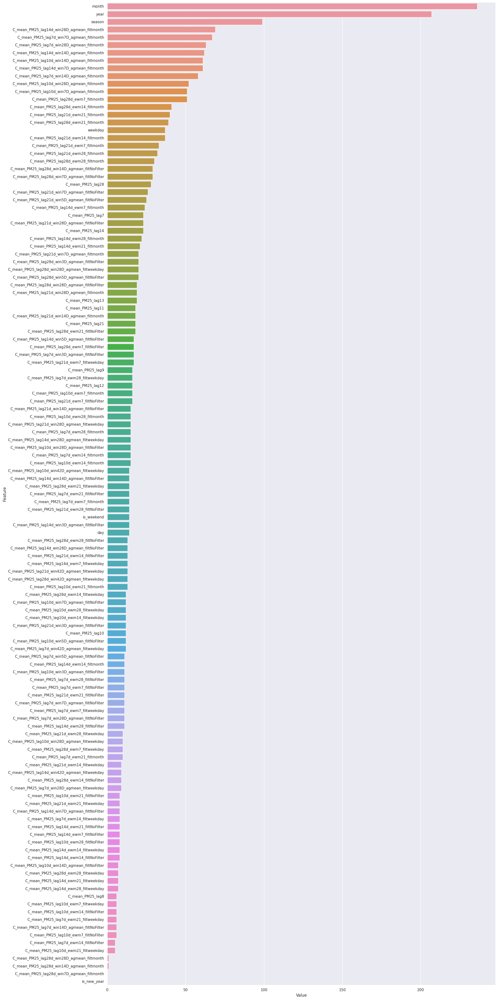

In [132]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [145]:
df_score.loc[df_score.shape[0]] = {'target': 'C_mean', 'pol_id' : 6001, 'weather': False, 'sources': 'C_mean, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566
2,AQI,7,False,"AQI, lag, gen_lag",12.279893,12.105680
3,C_mean,7,True,"C_mean, gen_lag",8.139092,8.057300
4,C_mean,6001,True,"C_mean, lag, gen_lag",2.117920,19.359004
5,AQI,6001,True,"AQI, lag, gen_lag",9.952003,49.291089
6,C_mean,6001,False,"C_mean, lag, gen_lag",4.719888,24.367074


In [28]:
y_val_pred = optuna_helper.predict_by_best_model(x_val)
y_aqi_pred = aqc.calc_aqi_for_day_target(6001, y_val_pred, POL_MEASURES[6001])
x_aqi, y_aqi = ts_splitter.split_x_y_for_period(df_timeseries=df_joint,
                                                index_cols='DatetimeEnd', y_value_col='AQI_PM25',
                                                dt_start=VAL_DATE_FROM, dt_end=VAL_DATE_TO)
math.sqrt(metrics.mean_squared_error(y_aqi.values, y_aqi_pred))

55.072679252057455

## PM 10

### PM10 AQI - by AQI, weather

In [33]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=5, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [34]:
optuna_helper.run_params_search(n_trials=100, n_jobs=12, study_name="pm10", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 1 finished with best value: 21.069023495241037 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2800, 'num_leaves': 44, 'learning_rate': 0.1173039823007162, 'subsample': 0.03433845750477582, 'subsample_freq': 6, 'subsample_for_bin': 244821, 'min_child_samples': 238, 'reg_alpha': 0.36979383982590563, 'reg_lambda': 0.4624262971083112, 'max_depth': 6, 'max_bin': 339, 'categorical_features': ['season', 'month', 'weekday']}. 
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature whic

7.704525254177178

In [55]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2600, 'num_leaves': 43, 'learning_rate': 0.1005102945331774, 'subsample': 0.9567190854755214, 'subsample_freq': 2, 'subsample_for_bin': 164887, 'min_child_samples': 52, 'reg_alpha': 0.8268141247007246, 'reg_lambda': 0.21301808988108897, 'max_depth': 6, 'max_bin': 381}
best_categories =  ['season', 'weekday']
best_features_count = 13 #len(x_train.columns) #31
#(4.36542051478995, 7.632124720212325)

best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1100, 'num_leaves': 55, 'learning_rate': 0.13336706254004013, 'subsample': 0.7110931352351093, 'subsample_freq': 0, 'subsample_for_bin': 194563, 'min_child_samples': 45, 'reg_alpha': 0.18017308854453762, 'reg_lambda': 0.8264670184761244, 'max_depth': 5, 'max_bin': 270}

best_categories =  ['season', 'weekday']
best_features_count = 31 #len(x_train.columns) #31
#(2.3928217801726026, 4.994203443123111)

optuna_helper.cut_best_features(best_features_count)
optuna_helper.study_best_params = best_params_res
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(2.392821780172603, 4.994203443123111)

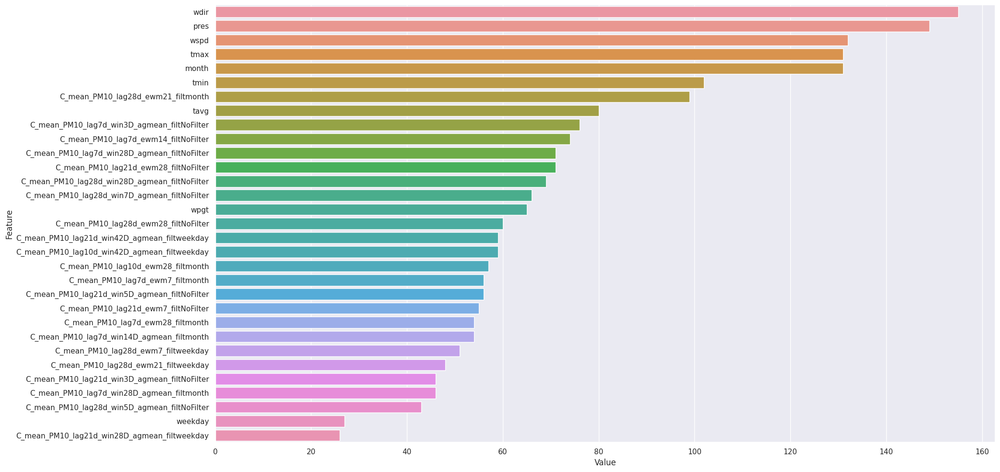

In [37]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [156]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 5, 'weather': True, 'sources': 'AQI, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566
2,AQI,7,False,"AQI, lag, gen_lag",12.279893,12.105680
3,C_mean,7,True,"C_mean, gen_lag",8.139092,8.057300
4,C_mean,6001,True,"C_mean, lag, gen_lag",2.117920,19.359004
5,AQI,6001,True,"AQI, lag, gen_lag",9.952003,49.291089
6,C_mean,6001,False,"C_mean, lag, gen_lag",4.719888,24.367074
7,AQI,5,True,"AQI, lag, gen_lag",4.365421,7.632125


### PM10 Concentration - generated lags, weather

In [157]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=5, prediction_value_type=lgbm_fl.PredictionValueType.C_MEAN,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [158]:
optuna_helper.run_params_search(n_trials=100, n_jobs=12, study_name="pm10", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 6 finished with best value: 23.0020916291776 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1400, 'num_leaves': 113, 'learning_rate': 0.05312758841870835, 'subsample': 0.24846325913579637, 'subsam

8.64802994125774

In [174]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1900, 'num_leaves': 39, 'learning_rate': 0.05569086317852491, 'subsample': 0.7769175552047453, 'subsample_freq': 0, 'subsample_for_bin': 471826, 'min_child_samples': 45, 'reg_alpha': 0.6025294628491372, 'reg_lambda': 0.16697780307434865, 'max_depth': 10, 'max_bin': 364, 'categorical_features': ['season']}

best_categories =  ['season']
best_features_count = 12 #len(x_train.columns)
optuna_helper.study_best_params = best_params_res
optuna_helper.cut_best_features(best_features_count)
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(3.7792682925951997, 6.9379282808021365)

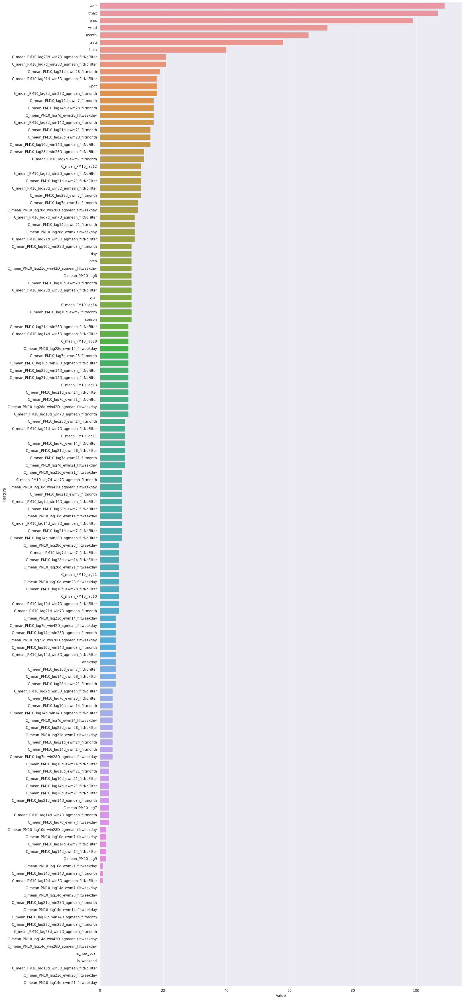

In [160]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [175]:
df_score.loc[df_score.shape[0]] = {'target': 'C_mean', 'pol_id' : 5, 'weather': True, 'sources': 'C_mean, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566
2,AQI,7,False,"AQI, lag, gen_lag",12.279893,12.105680
3,C_mean,7,True,"C_mean, gen_lag",8.139092,8.057300
4,C_mean,6001,True,"C_mean, lag, gen_lag",2.117920,19.359004
5,AQI,6001,True,"AQI, lag, gen_lag",9.952003,49.291089
6,C_mean,6001,False,"C_mean, lag, gen_lag",4.719888,24.367074
7,AQI,5,True,"AQI, lag, gen_lag",4.365421,7.632125
8,C_mean,5,True,"C_mean, lag, gen_lag",3.779268,6.937928


### PM10 Concentration - generated lags, no weather

In [179]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=5, prediction_value_type=lgbm_fl.PredictionValueType.C_MEAN,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=False, use_gen_lags_cols=True, use_weather_cols=False,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [180]:
optuna_helper.run_params_search(n_trials=100, n_jobs=6, study_name="pm10", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 4 finished with best value: 15.593759775975862 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1700, 'num_leaves': 74, 'learning_rate': 0.06854307684366141, 'subsample': 0.5588716920190506, 'subsample_freq': 10, 'subsample_for_bin': 236049, 'min_child_samples': 457, 'reg_alpha': 0.3099733985781762, 'reg_lambda': 0.92223053082129, 'max_depth': 10, 'max_bin': 261, 'categorical_features': ['season']}. 
Trial 0 finished with best value: 12.252254488874415 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2300, 'num_leaves': 131, 'learning_rate': 0.11735010747661681, 'subsample': 0.7059323034555107, 'subsample_freq': 0, 'subsample_for_bin'

9.186247037760518

In [187]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 1900, 'num_leaves': 116, 'learning_rate': 0.11753265751287909, 'subsample': 0.6696569414114247, 'subsample_freq': 8, 'subsample_for_bin': 198843, 'min_child_samples': 53, 'reg_alpha': 0.5094407550503982, 'reg_lambda': 0.8035571634731377, 'max_depth': 10, 'max_bin': 180, 'categorical_features': ['month']}

best_categories =  ['month']
best_features_count = 106 #len(x_train.columns)
optuna_helper.study_best_params = best_params_res
optuna_helper.cut_best_features(best_features_count)
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(2.4552654264680362, 7.0026359052311795)

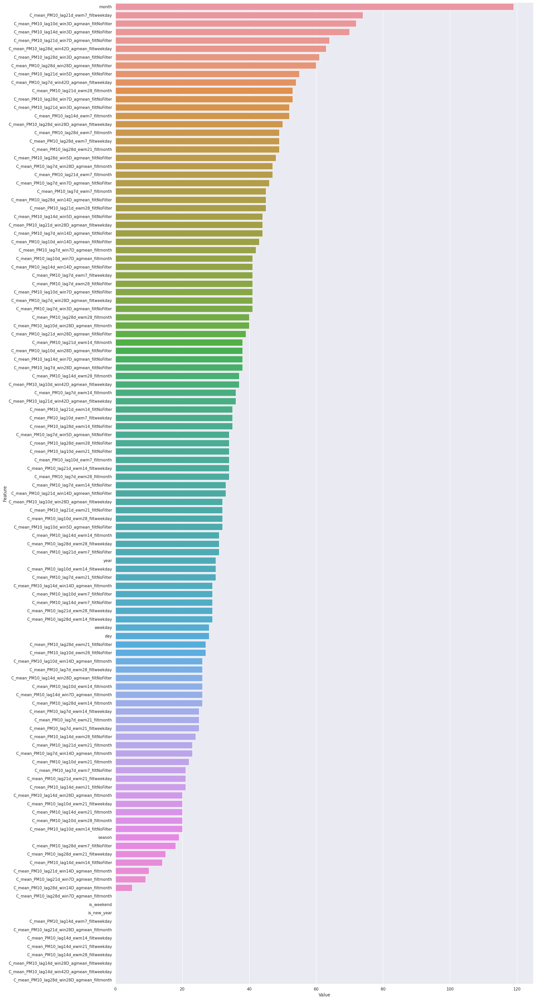

In [182]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [ ]:
df_score.loc[df_score.shape[0]] = {'target': 'C_mean', 'pol_id' : 5, 'weather': False, 'sources': 'C_mean, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score.to_csv('score.csv')
df_score

### PM10 AQI - generated lags, no weather

In [196]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=5, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=True, use_c_mean_cols=False, use_lag_cols=False, use_gen_lags_cols=True, use_weather_cols=False,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [197]:
optuna_helper.run_params_search(n_trials=100, n_jobs=6, study_name="pm10", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 0 finished with best value: 21.069023495241037 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1100, 'num_leaves': 109, 'learning_rate': 0.12858338588772933, 'subsample': 0.18169839373573415, 'subsample_freq': 8, 'subsample_for_bin': 103827, 'min_child_samples': 320, 'reg_alpha': 0.3717892541169524, 'reg_lambda': 0.4569511421747082, 'max_depth': 9, 'max_bin': 352, 'categorical_features': ['season', 'month']}. 
Trial 4 finished with best value: 16.0824850062612 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1800, 'num_leaves': 27, 'learning_rate': 0.14304628582220705, 'subsample': 0.6276182997504547, 'subsample_freq': 1, 'subsample_fo

8.20871607385521

In [208]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2000, 'num_leaves': 105, 'learning_rate': 0.050569774730074186, 'subsample': 0.41969104773577975, 'subsample_freq': 1, 'subsample_for_bin': 442331, 'min_child_samples': 17, 'reg_alpha': 0.44245965231721673, 'reg_lambda': 0.09522803406943282, 'max_depth': 9, 'max_bin': 145, 'categorical_features': []}

best_categories =  []
best_features_count = 21# len(x_train.columns)
optuna_helper.study_best_params = best_params_res
optuna_helper.cut_best_features(best_features_count)
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(5.521119338443206, 5.454182529772568)

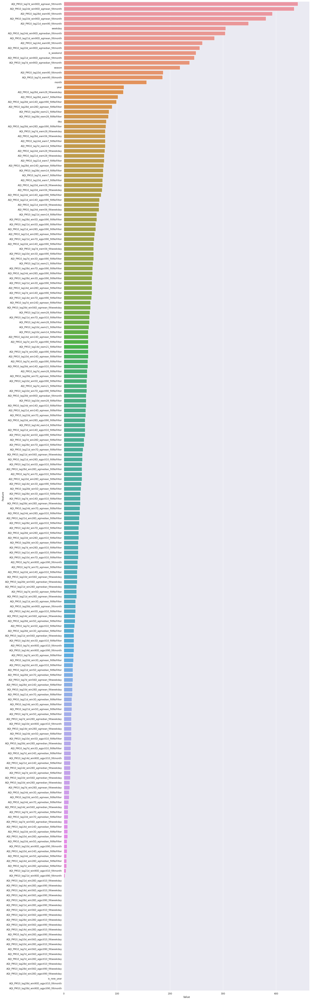

In [199]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [ ]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 5, 'weather': False, 'sources': 'AQI, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score.to_csv('score.csv')
df_score

## NO2

### NO2 AQI - weather

In [214]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=8, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=True, use_c_mean_cols=False, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [215]:
optuna_helper.run_params_search(n_trials=100, n_jobs=12, study_name="no2", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

Trial 9 finished with best value: 31.046980758240966 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1100, 'num_leaves': 107, 'learning_rate': 0.08530721173443401, 'subsample': 0.023364993356599806, 'subsample_freq': 9, 'subsample_for_bin': 411320, 'min_child_samples': 307, 'reg_alpha': 0.3632056818060432, 'reg_lambda': 0.15860661055448944, 'max_depth': 9, 'max_bin': 230, 'categorical_features': []}. 
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 7 finished with best value: 25.294107408005324 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2300, 'num_leaves': 56, 'learning_rate': 0.10076081881375681, 'subsample': 0.3114040403278704, 'subsample_freq': 6, 'subsample_for_bin': 32447

7.598978782703654

In [232]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2200, 'num_leaves': 140, 'learning_rate': 0.076297211673832, 'subsample': 0.9048416321209771, 'subsample_freq': 1, 'subsample_for_bin': 141792, 'min_child_samples': 48, 'reg_alpha': 0.31049100804293384, 'reg_lambda': 0.7272704696443957, 'max_depth': 4, 'max_bin': 307, 'categorical_features': ['season', 'month']}

best_categories =  ['season', 'month']
best_features_count = 30 #len(x_train.columns)
optuna_helper.cut_best_features(best_features_count)
optuna_helper.study_best_params = best_params_res
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(4.45541823885513, 3.102035721368486)

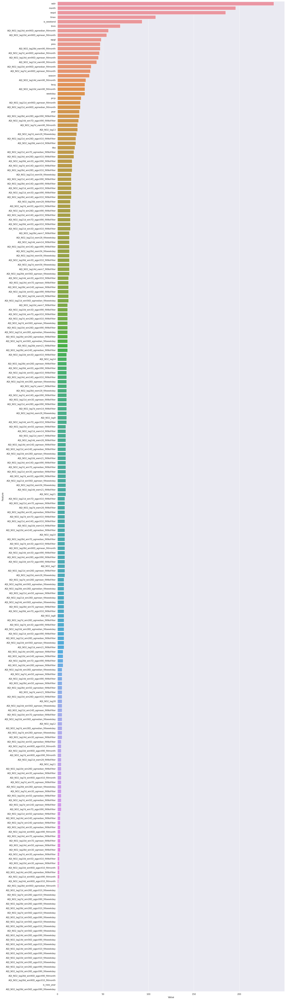

In [217]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [235]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 8, 'weather': True, 'sources': 'AQI, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score.to_csv('score.csv')
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566
2,AQI,7,False,"AQI, lag, gen_lag",12.279893,12.105680
3,C_mean,7,True,"C_mean, gen_lag",8.139092,8.057300
4,C_mean,6001,True,"C_mean, lag, gen_lag",2.117920,19.359004
5,AQI,6001,True,"AQI, lag, gen_lag",9.952003,49.291089
6,C_mean,6001,False,"C_mean, lag, gen_lag",4.719888,24.367074
7,AQI,5,True,"AQI, lag, gen_lag",4.365421,7.632125
8,C_mean,5,True,"C_mean, lag, gen_lag",3.779268,6.937928
9,C_mean,5,False,"C_mean, gen_lag",2.455265,7.002636


### NO2 AQI - no weather

In [282]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=8, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=True, use_c_mean_cols=False, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=False,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [237]:
optuna_helper.run_params_search(n_trials=100, n_jobs=12, study_name="no2", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 3 finished with best value: 31.046980758240966 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 3000, 'num_leaves': 80, 'learning_rate': 0.13118527878171335, 'subsample': 0.3851281410161431, 'subsample_freq': 1, 'subsample_for_bin': 429029, 'min_child_samples': 595, 'reg_alpha': 0.7226454307746203, 'reg_lambda': 0.4170807267239437, 'm

9.489954343210542

In [275]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2900, 'num_leaves': 66, 'learning_rate': 0.10975633386859357, 'subsample': 0.8780594428495838, 'subsample_freq': 2, 'subsample_for_bin': 101327, 'min_child_samples': 117, 'reg_alpha': 0.48462694455670574, 'reg_lambda': 0.12285388951944207, 'max_depth': 11, 'max_bin': 330, 'categorical_features': ['season', 'month']}

best_categories =  ['season', 'month', 'weekday']
best_features_count = 211 # len(x_train.columns)
optuna_helper.cut_best_features(best_features_count)
optuna_helper.study_best_params = best_params_res
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(7.481730399245865, 9.675247691475747)

In [271]:
len(x_train.columns)

212

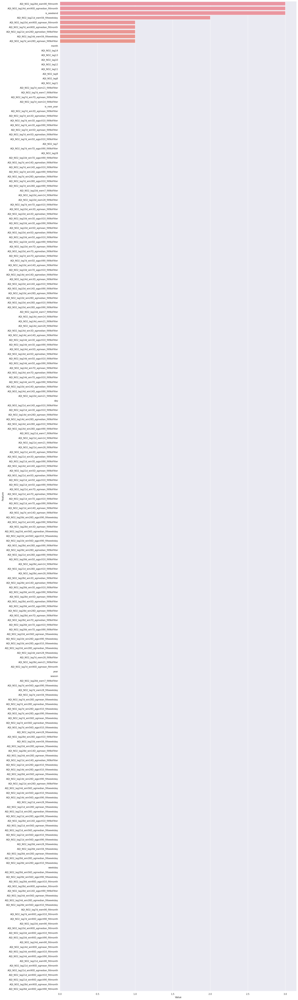

In [262]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [276]:
df_score.loc[df_score.shape[0]] = {'target': 'AQI', 'pol_id' : 8, 'weather': False, 'sources': 'AQI, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score.to_csv('score.csv')
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566
2,AQI,7,False,"AQI, lag, gen_lag",12.279893,12.105680
3,C_mean,7,True,"C_mean, gen_lag",8.139092,8.057300
4,C_mean,6001,True,"C_mean, lag, gen_lag",2.117920,19.359004
5,AQI,6001,True,"AQI, lag, gen_lag",9.952003,49.291089
6,C_mean,6001,False,"C_mean, lag, gen_lag",4.719888,24.367074
7,AQI,5,True,"AQI, lag, gen_lag",4.365421,7.632125
8,C_mean,5,True,"C_mean, lag, gen_lag",3.779268,6.937928
9,C_mean,5,False,"C_mean, gen_lag",2.455265,7.002636


### NO2 Concentration - weather

In [283]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month', 'weekday']

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=8, prediction_value_type=lgbm_fl.PredictionValueType.C_MEAN,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=True, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [284]:
optuna_helper.run_params_search(n_trials=100, n_jobs=12, study_name="no2", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(8), warm_params=None)

run_params_search n_trials=100, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/100 [00:00<?, ?it/s]

[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 5 finished with best value: 35.13019781612928 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2700, 'num_leaves': 27, 'learning_rate': 0.10539512686447361, 'subsample': 0.06637947489450435, 'subsample_freq': 9, 'subsample_for_bin': 494566, 'min_child_samples': 477, 'reg_alpha': 0.7741270494324731, 'reg_lambda': 0.15391325316547144, 'max_depth': 8, 'max_bin': 216, 'categorical_features': ['season', 'month', 'weekday']}. 
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 12 finished with best value: 30.9116919059

7.196524929213578

In [299]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 1400, 'num_leaves': 65, 'learning_rate': 0.09600727733988766, 'subsample': 0.4920534489555584, 'subsample_freq': 0, 'subsample_for_bin': 421165, 'min_child_samples': 33, 'reg_alpha': 0.20096552313682287, 'reg_lambda': 0.5215290163036778, 'max_depth': 3, 'max_bin': 284, 'categorical_features': ['season', 'month']}

best_categories =  ['season', 'month']
best_features_count = 18 #len(x_train.columns)
optuna_helper.cut_best_features(best_features_count)
optuna_helper.study_best_params = best_params_res
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(5.310852609460981, 6.591070690734818)

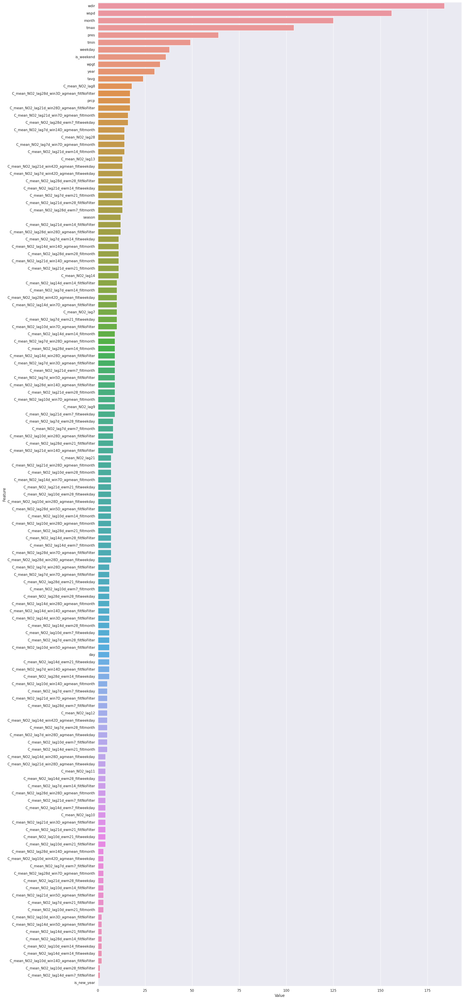

In [288]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=best_features_count, plot_bar=True)

In [300]:
df_score.loc[df_score.shape[0]] = {'target': 'C_mean', 'pol_id' : 8, 'weather': True, 'sources': 'C_mean, lag, gen_lag',  'train_score': score_train, 'val_score': score_val }
df_score.to_csv('score.csv')
df_score

,target,pol_id,weather,sources,train_score,val_score
0,AQI,7,True,"AQI, lag, gen_lag",3.542296,7.429275
1,AQI,7,False,"AQI, gen_lag",13.617533,10.619566
2,AQI,7,False,"AQI, lag, gen_lag",12.279893,12.105680
3,C_mean,7,True,"C_mean, gen_lag",8.139092,8.057300
4,C_mean,6001,True,"C_mean, lag, gen_lag",2.117920,19.359004
5,AQI,6001,True,"AQI, lag, gen_lag",9.952003,49.291089
6,C_mean,6001,False,"C_mean, lag, gen_lag",4.719888,24.367074
7,AQI,5,True,"AQI, lag, gen_lag",4.365421,7.632125
8,C_mean,5,True,"C_mean, lag, gen_lag",3.779268,6.937928
9,C_mean,5,False,"C_mean, gen_lag",2.455265,7.002636


## GEN AQI

### GEN AQI - weather

In [84]:
default_params = {'n_jobs': -1, 'verbosity': -1, 'metric': METRIC, 'boosting_type': 'gbdt',
    'extra_trees': True, 'n_estimators': 1000, 'num_leaves': 150, 'learning_rate': 0.01, 'subsample': 0.7, 'subsample_freq': 5, 'subsample_for_bin': 100000, 'min_child_samples': 30, 'reg_alpha': 0.1, 'reg_lambda': 0.2, 'max_depth': 10, 'max_bin': 150}

default_category =['season', 'month', 'weekday']
cats = [['season', 'month', 'weekday'], ['month', 'weekday'], ['season', 'month', 'year', 'weekday']]

default_features_count = -1

optuna_helper, x_train, y_train, x_val, y_val = lgbm_fl.init_optuna(
    df_timeseries=df_joint, pol_id=0, prediction_value_type=lgbm_fl.PredictionValueType.AQI,
    use_aqi_cols=False, use_c_mean_cols=True, use_lag_cols=False, use_gen_lags_cols=True, use_weather_cols=True,
    train_start_dt=TRAIN_DATE_FROM, train_end_dt=TRAIN_DATE_TO, test_start_dt=VAL_DATE_FROM, test_end_dt=VAL_DATE_TO, default_params=default_params, default_category=default_category, categories_for_optimization=CATEGORIES, default_top_features_count=default_features_count)

In [69]:
optuna_helper.run_params_search(n_trials=80, n_jobs=4, study_name="gen", save_best_params=True,   direction=OPTIMIZATION_DIRECTION, best_features_only=True, search_category=True, with_pruner=True, cv_splitter= TimeSeriesSplit(16), warm_params=None)

run_params_search n_trials=80, search_category=True, best_features_only=True, with_pruner=True


  0%|          | 0/80 [00:00<?, ?it/s]

Trial 1 finished with best value: 54.90132193066021 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': True, 'n_estimators': 2500, 'num_leaves': 83, 'learning_rate': 0.05469420333550946, 'subsample': 0.09433131389504779, 'subsample_freq': 9, 'subsample_for_bin': 206808, 'min_child_samples': 187, 'reg_alpha': 0.20765947391740447, 'reg_lambda': 0.03467876324484698, 'max_depth': 7, 'max_bin': 290, 'categorical_features': []}. 
[LightGBM] [Warning] Met categorical feature which contains sparse values. Consider renumbering to consecutive integers started from zero
Trial 2 finished with best value: 52.94240130616084 and parameters: {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2500, 'num_leaves': 150, 'learning_rate': 0.10623207615445872, 'subsample': 0.3453084710819556, 'subsample_freq': 1, 'subsample_for_bin': 357320

16.89941342970303

In [90]:
best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2100, 'num_leaves': 97, 'learning_rate': 0.11890042003021366, 'subsample': 0.4318782580934736, 'subsample_freq': 0, 'subsample_for_bin': 193295, 'min_child_samples': 14, 'reg_alpha': 0.394194026403052, 'reg_lambda': 0.708405421324422, 'max_depth': 3, 'max_bin': 206}

# best_params_res = {'n_jobs': -1, 'verbosity': -1, 'objective': 'regression', 'metric': 'rmse', 'boosting_type': 'gbdt', 'extra_trees': False, 'n_estimators': 2300, 'num_leaves': 92, 'learning_rate': 0.06693724505417498, 'subsample': 0.4996879432385452, 'subsample_freq': 2, 'subsample_for_bin': 248896, 'min_child_samples': 11, 'reg_alpha': 0.1843270826906438, 'reg_lambda': 0.9740411136294487, 'max_depth': 11, 'max_bin': 228, 'categorical_features': ['season']}

best_categories =  ['month', 'weekday']
best_features_count = 160 # len(x_train.columns)
optuna_helper.study_best_params = best_params_res
optuna_helper.cut_best_features(best_features_count)
score_train, score_val, model = optuna_helper.run_model_and_eval(params=best_params_res,  categorical_features=best_categories, best_features_only=True, set_as_best_model=True)
score_train, score_val

(3.840019618661612, 45.99420422443052)

In [47]:
len(x_train.columns)

495

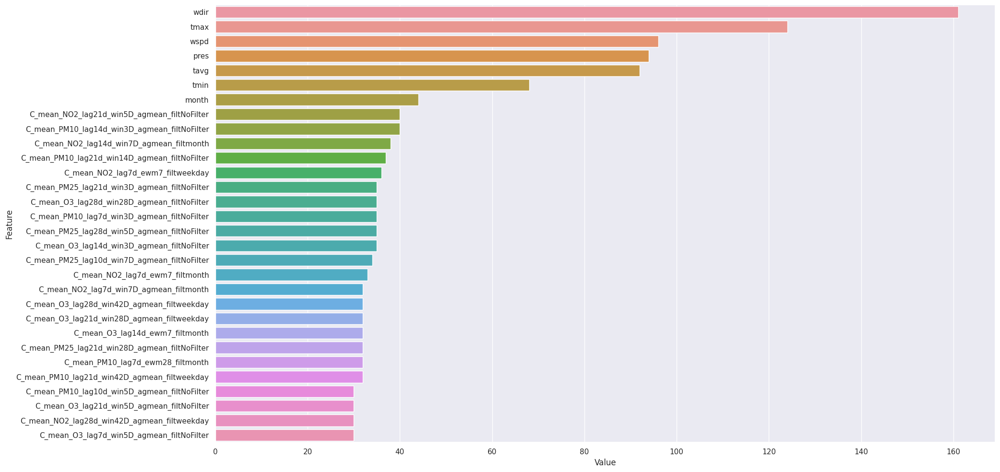

In [92]:
feat_imp_df = feat_imp_ext.get_and_plot_feature_importance(optuna_helper.best_model, optuna_helper.best_features_list, num=30, plot_bar=True)